# Proyecto final
Este notebook tiene como objetivo ser presentado como trabajo final del módulo 1 del programa de formación MLDS.

In [259]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import folium
from scipy import stats
import scipy
import statsmodels.api as sm
from folium import plugins
import statsmodels.formula.api as smf
from sklearn import datasets, linear_model

# Descripción del dataset
El dataset que utilizaré para este proyecto es de la base de datos de la aplicación Airbnb, la cual se puede consultar en este [link](http://insideairbnb.com/get-the-data.html).
Específicamente, seleccione el listado de alojamientos de la ciudad de Madrid en España,el cual contiene la información detallada de los anuncios publicados de la ciudad.

# Problemas
Supongamos que quiero viajar a Madrid y no tengo donde alojarme, por lo cual decido utilizar la aplicación Airbnb para conseguir hospedaje. Teniendo en cuenta lo anterior mencionado, me gustaría saber cuáles son los alojamientos más baratos por sector, cuáles son los mejores valorados por sector, cuanto debería pagar por un alojamiento con características específicas y cuáles son las zonas con mejor relación calidad precio para hospedarme. 

# Objetivos 
# Generales


*   Conocer la distribución de precios y reseñas en la ciudad

# Específicos

*   Encontrar los alojamientos con mejor relación calidad precio por sector
*   Hacer un modelo de regresión para calcular precio aproximado de alojamiento usando parámetros dados.



#Carga de datos

In [260]:
lista_original = pd.read_csv('listings.csv')

In [261]:
lista_original.head(15)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,6369,https://www.airbnb.com/rooms/6369,20211208225122,2021-12-09,"Rooftop terrace room , ensuite bathroom",Excellent connection with the AIRPORT and EXHI...,NaN,https://a0.muscache.com/pictures/683224/4cc318...,13660,https://www.airbnb.com/users/show/13660,...,4.89,4.78,4.85,NaN,f,1,0,1,0,0.57
1,21853,https://www.airbnb.com/rooms/21853,20211208225122,2021-12-09,Bright and airy room,We have a quiet and sunny room with a good vie...,We live in a leafy neighbourhood with plenty o...,https://a0.muscache.com/pictures/68483181/87bc...,83531,https://www.airbnb.com/users/show/83531,...,4.82,4.21,4.67,NaN,f,2,0,2,0,0.38
2,23001,https://www.airbnb.com/rooms/23001,20211208225122,2021-12-09,Apartmento Arganzuela- Madrid Rio,"Apartamento de tres dormitorios dobles, gran s...","Barrio Arganzuela, junto a Madrid Rio, zonas c...",https://a0.muscache.com/pictures/58e6a770-509c...,82175,https://www.airbnb.com/users/show/82175,...,NaN,NaN,NaN,NaN,f,6,5,1,0,NaN
3,24805,https://www.airbnb.com/rooms/24805,20211208225122,2021-12-09,Gran Via Studio Madrid,"Studio located 50 meters from Gran Via, next t...","The area is next to the Gran Via, so people li...",https://a0.muscache.com/pictures/miso/Hosting-...,346366726,https://www.airbnb.com/users/show/346366726,...,5.00,5.00,4.79,NaN,f,1,1,0,0,0.16
4,26825,https://www.airbnb.com/rooms/26825,20211208225122,2021-12-09,Single Room whith private Bathroom,Nice and cozy roon for one person with a priva...,"Es un barrio muy tranquilo, en una zona de Mad...",https://a0.muscache.com/pictures/149358/218d5b...,114340,https://www.airbnb.com/users/show/114340,...,4.71,4.71,4.72,NaN,f,1,0,1,0,1.09
5,28200,https://www.airbnb.com/rooms/28200,20211208225122,2021-12-09,Apartamento Arganzuela Planetario,<b>The space</b><br />Se alquila un fantástico...,NaN,https://a0.muscache.com/pictures/156981/adb417...,82175,https://www.airbnb.com/users/show/82175,...,4.50,4.33,4.50,NaN,f,6,5,1,0,0.06
6,30959,https://www.airbnb.com/rooms/30959,20211208225122,2021-12-09,Beautiful loft in Madrid Center,Beautiful Loft 60m2 size just in the historica...,NaN,https://a0.muscache.com/pictures/78173471/835e...,132883,https://www.airbnb.com/users/show/132883,...,4.63,4.88,4.25,NaN,f,1,1,0,0,0.10
7,37859,https://www.airbnb.com/rooms/37859,20211208225122,2021-12-09,"PISO, OPERA, MADRID, GRANDE","<b>The space</b><br />Hola soy Nacho, alquilo ...",NaN,https://a0.muscache.com/pictures/3399556/c2c8c...,162701,https://www.airbnb.com/users/show/162701,...,NaN,NaN,NaN,NaN,f,3,1,2,0,NaN
8,40718,https://www.airbnb.com/rooms/40718,20211208225122,2021-12-09,COZY APARTMENT CIBELES-GRAN VIA-PTA DEL SOL-CH...,"<b>The space</b><br />Apartment, 1 Bedroom + O...",NaN,https://a0.muscache.com/pictures/99a841d9-e992...,34217435,https://www.airbnb.com/users/show/34217435,...,4.86,4.95,4.68,NaN,t,9,9,0,0,0.87
9,47957,https://www.airbnb.com/rooms/47957,20211208225122,2021-12-09,"Amazing Apartment, Salamanca Distri",<b>The space</b><br />Totally remodeled modern...,NaN,https://a0.muscache.com/pictures/463140/d47b22...,218515,https://www.airbnb.com/users/show/218515,...,4.82,4.90,4.78,NaN,f,2,2,0,0,0.41


In [262]:
lista_original.shape

(17831, 74)

# Exploración de los datos
Como se puede apreciar en el código de arriba, son 74 columnas, por lo cual crearé una copia para recortar algunas columnas que no considero pertinentes para el análisis.

In [263]:
lista=lista_original

In [264]:
lista=lista.drop(['listing_url','scrape_id','last_scraped','picture_url','host_url','host_since','host_response_time','host_response_rate','host_acceptance_rate','host_is_superhost','host_thumbnail_url','host_picture_url','host_neighbourhood','host_listings_count','host_total_listings_count','host_verifications','host_has_profile_pic','host_identity_verified','neighbourhood_cleansed','neighbourhood_group_cleansed','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','license','instant_bookable','calculated_host_listings_count','calculated_host_listings_count_entire_homes','calculated_host_listings_count_private_rooms','calculated_host_listings_count_shared_rooms','reviews_per_month','minimum_minimum_nights','maximum_minimum_nights','minimum_maximum_nights','maximum_maximum_nights','minimum_nights_avg_ntm','maximum_nights_avg_ntm','calendar_updated','has_availability','availability_30','availability_60','availability_90','availability_365','calendar_last_scraped','number_of_reviews_ltm','bathrooms_text','number_of_reviews','bathrooms','number_of_reviews_l30d','first_review','last_review','review_scores_cleanliness','amenities','review_scores_accuracy'], axis=1)

In [265]:
lista.columns

Index(['id', 'name', 'description', 'neighborhood_overview', 'host_id',
       'host_name', 'host_location', 'host_about', 'neighbourhood', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bedrooms',
       'beds', 'price', 'minimum_nights', 'maximum_nights',
       'review_scores_rating'],
      dtype='object')

Ahora que disminuí las columnas voy a describirlas:


* **id:**  Número de identificación único del anuncio
* **name:** Nombre de la publicación
* **description:** Descripción del anuncio
* **neighborhood_overview:** Descripción del barrio dada por el arrendatario
* **host_id:** Número de identificación único del arrendatario
* **host_name:** Nombre del arrendatario
* **host_location:** Ubicación del arrendatario
* **host_about:** Descripción del arrendatario
* **neighbourhood:** Nombre del vecindario
* **latitude:** Latitud del hospedaje
* **longitude:** Longitud del hospedaje
* **property_type:** Tipo de propiedad (casa, edificio, hotel …)
* **room_type:** Tipo de habitación (compartida, privada, hotel…)
* **accommodates:** Número máximo de personas
* **bedrooms:** Número de dormitorios
* **beds:** Número de camas
* **price:** Precio por día
* **minimum_nights:** Mínimo de noches
* **maximum_nights:** Máximo de noches
* **review_scores_rating:** Calificación de usuarios al inmueble



Voy a cambiar el tipo de algunas variables, para poder hacer análisis descriptivo

In [266]:
for i in range(lista['price'].size):
  lista['price'][i]=lista['price'][i].replace('$','')
  lista['price'][i]=lista['price'][i].replace(',','')
for i in range(lista['price'].size):
   lista['price'][i]=float(lista['price'][i])
   lista['latitude'][i]=float(lista['latitude'][i])
   lista['longitude'][i]=float(lista['longitude'][i])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7

In [267]:
lista.describe()

,id,host_id,latitude,longitude,accommodates,bedrooms,beds,minimum_nights,maximum_nights,review_scores_rating
count,1.783100e+04,1.783100e+04,17831.000000,17831.000000,17831.000000,16436.000000,16968.000000,17831.000000,17831.000000,13677.000000
mean,3.164435e+07,1.386539e+08,40.420996,-3.694158,3.129437,1.449379,2.000413,7.430038,716.504907,4.574656
std,1.519928e+07,1.293288e+08,0.022412,0.028171,1.975044,0.832957,1.424367,36.639258,1390.311157,0.704692
min,6.369000e+03,7.952000e+03,40.316761,-3.836250,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000
25%,1.947884e+07,2.652194e+07,40.409540,-3.707620,2.000000,1.000000,1.000000,1.000000,90.000000,4.500000
50%,3.448713e+07,9.901898e+07,40.419620,-3.701180,2.000000,1.000000,2.000000,2.000000,1125.000000,4.750000
75%,4.441193e+07,2.317749e+08,40.429940,-3.686350,4.000000,2.000000,2.000000,3.000000,1125.000000,4.930000
max,5.372922e+07,4.350623e+08,40.536230,-3.544844,16.000000,18.000000,23.000000,1125.000000,142365.000000,5.000000


Primero miraremos algunas características generales de los precios y las calificaciones

In [268]:

lista['price'].astype('int').describe()


count    17831.000000
mean       135.347148
std        382.184647
min          0.000000
25%         40.000000
50%         72.000000
75%        117.000000
max      15960.000000
Name: price, dtype: float64

In [269]:
lista['review_scores_rating'].describe()

count    13677.000000
mean         4.574656
std          0.704692
min          0.000000
25%          4.500000
50%          4.750000
75%          4.930000
max          5.000000
Name: review_scores_rating, dtype: float64

Ahora miremos sus respectivos histogramas y boxplot

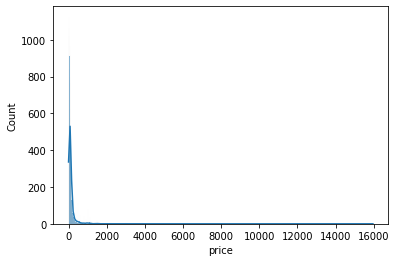

In [270]:
sns.histplot(lista['price'], kde=True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


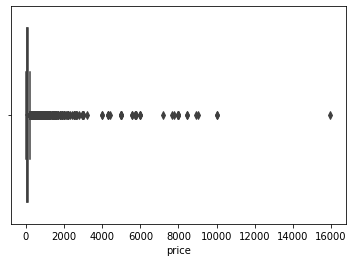

In [271]:
sns.boxplot(lista['price'])

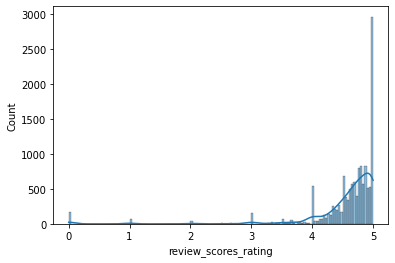

In [272]:
sns.histplot(lista['review_scores_rating'], kde=True)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


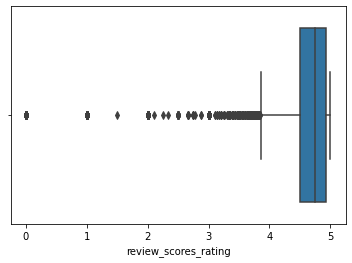

In [273]:
sns.boxplot(lista['review_scores_rating'])

Ahora miremos la distribución de precios de los alojamientos a través de un mapa de calor

In [274]:
heat_data = lista.groupby(["latitude","longitude"])['price'].mean().reset_index().values.tolist() 
mapa = folium.Map(location=[40.4167,  -3.70325 ], zoom_start=13) 
folium.plugins.HeatMap(heat_data).add_to(mapa)
mapa

Como el mapa se ve muy saturado agrupe por zonas

In [275]:
m = folium.Map(location=[40.4167,  -3.70325 ], zoom_start=13)
locations = list(zip(lista.latitude, lista.longitude))
cluster = plugins.MarkerCluster(locations=locations)  
m.add_child(cluster)
m


# Preparación de los datos
Después de ver los histogramas, boxplots y los mapas, llegue a la conclusión de que hay demasiados datos que no serán necesarios en el análisis que se llevara a cabo posteriormente, por lo cual haré lo siguiente:


*   Limpiare los datos que tengan valor nulo en campos importantes para el análisis
*   Pondré un tope de valor de renta, dado que hay demasiados outliers (ver boxplot)
* Dividiré los datos en 4 sectores, según su ubicación con respecto al centro, debido a que el atributo 'neighbourhood' es muy ambiguo



In [276]:
lista.isnull().sum().to_frame()

,0
id,0
name,3
description,824
neighborhood_overview,7384
host_id,0
host_name,8
host_location,52
host_about,8862
neighbourhood,7384
latitude,0


En este caso eliminaré los null de las calificaciones y de número de camas

In [277]:
lista = lista[lista['review_scores_rating'].notna()]
lista = lista[lista['beds'].notna()]
lista.reset_index(drop=True, inplace=True)
lista.isnull().sum().to_frame()

,0
id,0
name,0
description,372
neighborhood_overview,4435
host_id,0
host_name,4
host_location,30
host_about,5842
neighbourhood,4435
latitude,0


In [278]:
lista.head(15)

,id,name,description,neighborhood_overview,host_id,host_name,host_location,host_about,neighbourhood,latitude,longitude,property_type,room_type,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,review_scores_rating
0,6369,"Rooftop terrace room , ensuite bathroom",Excellent connection with the AIRPORT and EXHI...,NaN,13660,Simon,"Madrid, Community of Madrid, Spain","Gay couple, heterofriendly, enjoy having guest...",NaN,40.45724,-3.67688,Private room in rental unit,Private room,2,1.0,1.0,59.0,1,1125,4.88
1,21853,Bright and airy room,We have a quiet and sunny room with a good vie...,We live in a leafy neighbourhood with plenty o...,83531,Abdel,"Madrid, Madrid, Spain",EN-ES-FR\r\nEN\r\nHi everybody: I'm Abdel. I'm...,"Madrid, Spain",40.40381,-3.74130,Private room in rental unit,Private room,1,1.0,1.0,31.0,4,40,4.58
2,24805,Gran Via Studio Madrid,"Studio located 50 meters from Gran Via, next t...","The area is next to the Gran Via, so people li...",346366726,A,ES,NaN,"Madrid, Spain",40.42183,-3.70529,Entire rental unit,Entire home/apt,3,NaN,1.0,92.0,5,1125,4.86
3,26825,Single Room whith private Bathroom,Nice and cozy roon for one person with a priva...,"Es un barrio muy tranquilo, en una zona de Mad...",114340,Agustina,"Madrid, Madrid, Spain","I like Fine art, Photography, Cinema, travel a...","Madrid, Comunidad de Madrid, Spain",40.38975,-3.69018,Private room in residential home,Private room,1,1.0,1.0,29.0,2,1125,4.68
4,28200,Apartamento Arganzuela Planetario,<b>The space</b><br />Se alquila un fantástico...,NaN,82175,Jesus,"Madrid, Community of Madrid, Spain","Hi,\r\n\r\nWelcome to my apartments in the dow...",NaN,40.38860,-3.69492,Entire rental unit,Entire home/apt,4,3.0,3.0,85.0,1,365,4.17
5,30959,Beautiful loft in Madrid Center,Beautiful Loft 60m2 size just in the historica...,NaN,132883,Angela,"Madrid, Community of Madrid, Spain",Estoy empezando en Airbnb y deseo que mis hués...,NaN,40.41259,-3.70105,Entire loft,Entire home/apt,2,1.0,1.0,54.0,3,730,4.38
6,40718,COZY APARTMENT CIBELES-GRAN VIA-PTA DEL SOL-CH...,"<b>The space</b><br />Apartment, 1 Bedroom + O...",NaN,34217435,Luis,"Madrid, Community of Madrid, Spain",NaN,NaN,40.41969,-3.69736,Entire rental unit,Entire home/apt,4,1.0,2.0,83.0,2,500,4.61
7,47957,"Amazing Apartment, Salamanca Distri",<b>The space</b><br />Totally remodeled modern...,NaN,218515,Sergio,Spain,Motion Graphic Designer// Lived in West L.A a...,NaN,40.42792,-3.67682,Entire condominium (condo),Entire home/apt,3,2.0,2.0,82.0,10,999,4.83
8,62423,MAGIC ARTISTIC HOUSE IN THE CENTER OF MADRID,INCREDIBLE HOME OF AN ARTIST SURROUNDED BY PAI...,DISTRICT WITH VERY GOOD VIBES IN THE MIDDLE OF...,303845,Arturo,"Madrid, Community of Madrid, Spain",I am an artist... and I will be glad to have y...,"Madrid, Spain",40.41884,-3.69655,Private room in rental unit,Private room,3,1.0,2.0,52.0,1,90,4.60
9,70059,Tu hogar en centro de Madrid.,"Muy agradable, acogedor y luminoso, justo el C...",La ubicación de este apartamento es ideal para...,353616,Diana,"Madrid, Community of Madrid, Spain",Para mi lo importante son las personas.\r\nMe ...,"Madrid, Community of Madrid, Spain",40.42381,-3.71038,Entire rental unit,Entire home/apt,2,1.0,1.0,52.0,30,1125,4.70


Ahora seguimos poniendo el límite de precio, antes vamos a ver el boxplot después de la eliminación de los datos para ver que limite usar

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


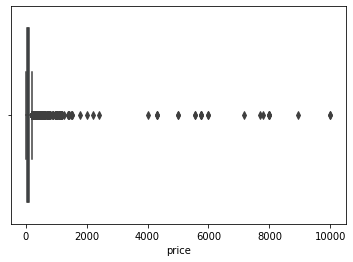

In [279]:
sns.boxplot(lista['price'])

Después de ver el gráfico, pondré el límite en 200 euros

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


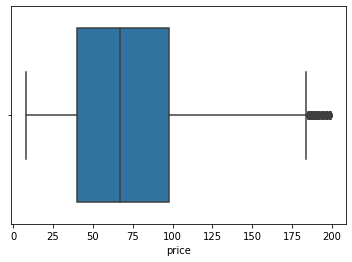

In [280]:
lista= lista[lista['price'] < 200]
sns.boxplot(lista['price'])

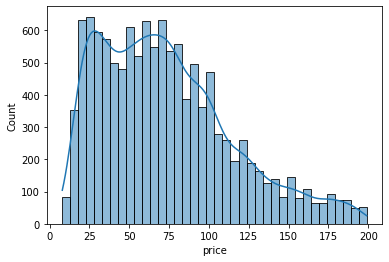

In [281]:
sns.histplot(lista['price'], kde=True)

In [282]:
lista.shape

(12106, 20)

La diferencia en los boxplot es clara, sin embargo, se descartaron casi el 30% de los datos. Esta cifra es alta, pero no es preocupante porque si tenemos en cuenta nuestros objetivos, no estamos interesados en ese casi 30% descartado.
Por lo cual proseguiré a crear una nueva columna para crear el dato, calidad, precio y posteriormente segmentar los datos.

In [283]:
lista=lista.assign(CalidadPrecio=(lista['review_scores_rating']/lista['price']))

D1=lista[lista['latitude'] > 40.4167]
D1=D1[D1['longitude']>-3.70325]
D2=lista[lista['latitude'] > 40.4167]
D2=D2[D2['longitude']<-3.70325]
D3=lista[lista['latitude'] < 40.4167]
D3=D3[D3['longitude']<-3.70325]
D4=lista[lista['latitude'] < 40.4167]
D4=D4[D4['longitude']>-3.70325]
D1.reset_index(drop=True, inplace=True)
D2.reset_index(drop=True, inplace=True)
D3.reset_index(drop=True, inplace=True)
D4.reset_index(drop=True, inplace=True)

Después de la segmentación, graficaré el mapa dividido por zonas, donde cada zona tiene marcadores de diferentes colores

In [284]:

mapa = folium.Map(location=[40.4167,  -3.70325 ], zoom_start=13)


for i in range(0,100):
  tooltip = i
  folium.Marker([D1['latitude'][i],D1['longitude'][i]], popup=lista_original['listing_url'][i], tooltip=tooltip,icon=folium.Icon(color="blue")).add_to(mapa)

for i in range(0,100):
  tooltip = i
  folium.Marker([D2['latitude'][i],D2['longitude'][i]], popup=lista_original['listing_url'][i], tooltip=tooltip,icon=folium.Icon(color="red")).add_to(mapa)

for i in range(0,100):
  tooltip = i
  folium.Marker([D3['latitude'][i],D3['longitude'][i]], popup=lista_original['listing_url'][i], tooltip=tooltip,icon=folium.Icon(color="green")).add_to(mapa)

for i in range(0,100):
  tooltip = i
  folium.Marker([D4['latitude'][i],D4['longitude'][i]], popup=lista_original['listing_url'][i], tooltip=tooltip,icon=folium.Icon(color="black")).add_to(mapa)
mapa

Ahora miremos la distribución de precios por zona

In [285]:
D1['price'].astype('float').describe()

count    4106.000000
mean       75.719191
std        42.120433
min         8.000000
25%        41.000000
50%        70.000000
75%       100.000000
max       199.000000
Name: price, dtype: float64

In [286]:
D2['price'].astype('float').describe()

count    2339.000000
mean       76.973493
std        42.123258
min        10.000000
25%        44.500000
50%        71.000000
75%       101.000000
max       199.000000
Name: price, dtype: float64

In [287]:
D3['price'].astype('float').describe()

count    2711.000000
mean       71.004795
std        41.338379
min         9.000000
25%        36.000000
50%        65.000000
75%        96.000000
max       199.000000
Name: price, dtype: float64

In [288]:
D4['price'].astype('float').describe()

count    2946.000000
mean       68.311270
std        39.197543
min         8.000000
25%        37.000000
50%        63.000000
75%        90.000000
max       199.000000
Name: price, dtype: float64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


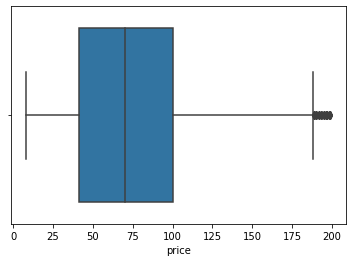

In [289]:
sns.boxplot(D1['price'])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


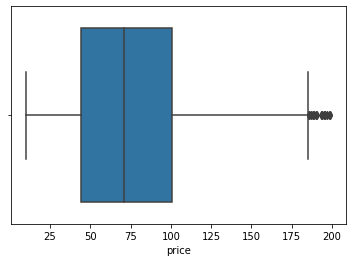

In [290]:
sns.boxplot(D2['price'])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


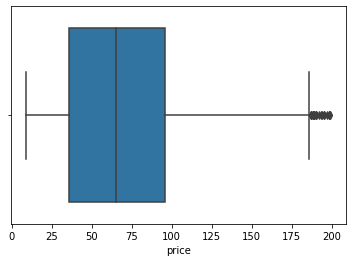

In [291]:
sns.boxplot(D3['price'])

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


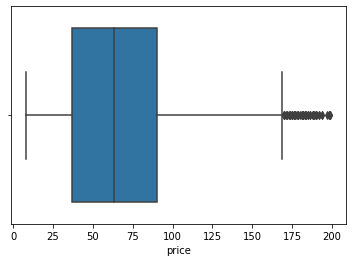

In [292]:
sns.boxplot(D4['price'])

Ahora miremos con la siguiente función si podemos concluir que hay una variación significativa en el precio entre las diferentes zonas.

In [293]:
def Hipotesis_Precio_Zonas(Z1,Z2,confianza):
 
   x=Z1['price']
   y=Z2['price']
   z_score, p_valor = sm.stats.ztest(x, y,value=0,alternative='two-sided')
   resultado =  'ninguna'
   
   if p_valor <= (1-confianza)/2:
     if x.mean()>y.mean():
       resultado= 'Z1'
     else:
         resultado='Z2'

   return resultado

In [294]:
print(Hipotesis_Precio_Zonas(D1,D2,95),Hipotesis_Precio_Zonas(D3,D2,95),Hipotesis_Precio_Zonas(D4,D2,95),Hipotesis_Precio_Zonas(D1,D3,95),Hipotesis_Precio_Zonas(D3,D4,95),Hipotesis_Precio_Zonas(D1,D4,95))

ninguna ninguna ninguna ninguna ninguna ninguna


Lo anterior nos dice que no hay diferencia de precios significativa entre dos zonas, lo cual nos indicaría que en  cada zona hay alojamientos con precios similares con respecto a las otras. Ahora tomemos en cuenta el rating que proporciona la página, por lo cual usaremos la columna anteriormente creada para ver los 10 hospedajes con mejor calidad precio.

In [295]:
D1=D1.sort_values('CalidadPrecio',ascending=False)
D2=D2.sort_values('CalidadPrecio',ascending=False)
D3=D3.sort_values('CalidadPrecio',ascending=False)
D4=D4.sort_values('CalidadPrecio',ascending=False)
D1.reset_index(drop=True, inplace=True)
D2.reset_index(drop=True, inplace=True)
D3.reset_index(drop=True, inplace=True)
D4.reset_index(drop=True, inplace=True)


In [296]:
mapa = folium.Map(location=[40.4167,  -3.70325 ], zoom_start=13)
for i in range(10):
  tooltip = i
  folium.Marker([D1['latitude'][i],D1['longitude'][i]], popup=lista_original['listing_url'][i], tooltip=tooltip,icon=folium.Icon(color="blue")).add_to(mapa)

for i in range(10):
  tooltip = i
  folium.Marker([D2['latitude'][i],D2['longitude'][i]], popup=lista_original['listing_url'][i], tooltip=tooltip,icon=folium.Icon(color="red")).add_to(mapa)

for i in range(10):
  tooltip = i
  folium.Marker([D3['latitude'][i],D3['longitude'][i]], popup=lista_original['listing_url'][i], tooltip=tooltip,icon=folium.Icon(color="green")).add_to(mapa)

for i in range(10):
  tooltip = i
  folium.Marker([D4['latitude'][i],D4['longitude'][i]], popup=lista_original['listing_url'][i], tooltip=tooltip,icon=folium.Icon(color="black")).add_to(mapa)
mapa

# Modelo de Regresión
Ahora miremos las correlaciones respectivas de cada zona con respecto a la variable precio

In [297]:
D1.corrwith(D1.price.astype(float)).sort_values()[::-1] 

accommodates            0.614994
beds                    0.432420
bedrooms                0.404478
maximum_nights          0.154584
id                      0.089178
host_id                 0.026574
review_scores_rating   -0.007117
minimum_nights         -0.034771
latitude               -0.132705
longitude              -0.210293
dtype: float64

In [298]:
D2.corrwith(D2.price.astype(float)).sort_values()[::-1] 

accommodates            0.619596
beds                    0.456504
bedrooms                0.418742
longitude               0.114059
review_scores_rating    0.036086
host_id                 0.028853
id                      0.014626
maximum_nights         -0.011784
minimum_nights         -0.061052
latitude               -0.259472
dtype: float64

In [299]:
D3.corrwith(D3.price.astype(float)).sort_values()[::-1] 

accommodates            0.636968
bedrooms                0.471907
beds                    0.403078
latitude                0.329068
longitude               0.299810
maximum_nights          0.077825
id                      0.062362
review_scores_rating    0.042107
host_id                 0.008363
minimum_nights         -0.060196
dtype: float64

In [300]:
D4.corrwith(D4.price.astype(float)).sort_values()[::-1] 

accommodates            0.673134
beds                    0.545855
bedrooms                0.487911
latitude                0.321004
maximum_nights          0.119275
id                      0.062963
host_id                 0.053527
review_scores_rating    0.046485
minimum_nights         -0.023322
longitude              -0.244864
dtype: float64

Note que la variable acomodación de la zona D4 fue la que mayor índice de correlación presento, por lo cual procederé a graficarla

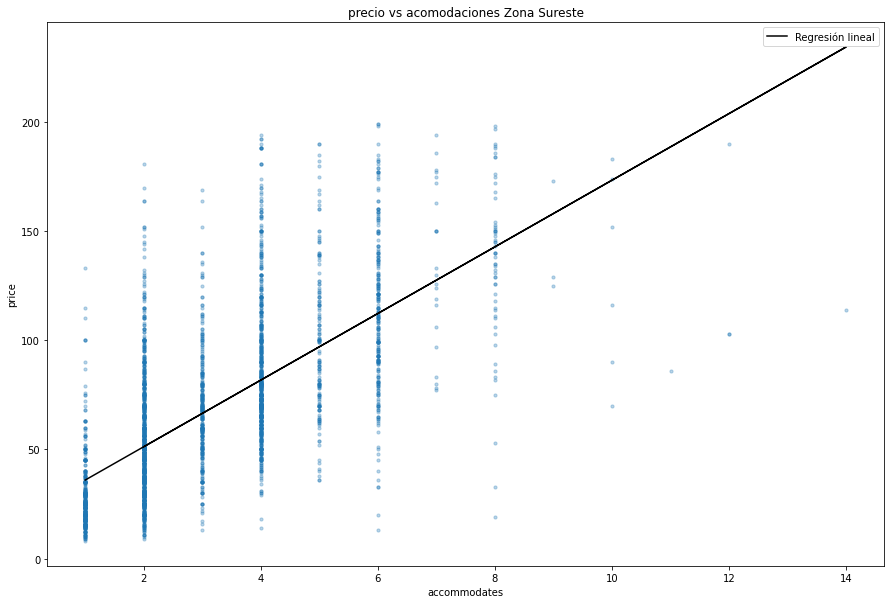

In [301]:
crecimiento1, valor_inicial1, correlación1, p_valor1,dstd1 = stats.linregress(D4['accommodates'].astype(int), D4['price'].astype(int))
D4['Regresion precio1'] =  crecimiento1 * D4['accommodates'] + valor_inicial1

ax = D4.plot.scatter('accommodates', 'price', title="precio vs acomodaciones Zona Sureste",
                s = 10, alpha = 0.3, grid=True,figsize=(15,10))
D4.plot.line('accommodates', 'Regresion precio1', 
                   c='black', label='Regresión lineal', ax=ax);  


La regresión lineal no parece ser muy buena en este caso, por lo cual haré una regresión multilineal en la zona D4 teniendo en cuenta la segunda variable con más correlación, la cual sería el número de camas.

In [302]:
D4

,id,name,description,neighborhood_overview,host_id,host_name,host_location,host_about,neighbourhood,latitude,...,room_type,accommodates,bedrooms,beds,price,minimum_nights,maximum_nights,review_scores_rating,CalidadPrecio,Regresion precio1
0,20049665,Luis,500,NaN,68664241,Luis Carlos,"Madrid, Community of Madrid, Spain",NaN,NaN,40.39485,...,Private room,1,1.0,1.0,8.0,1,1125,5.00,0.625,35.978652
1,30909198,Acogedora habitacion,"Acogedora habitación, amplia con grandes armar...","Es un barrio multicultural, seguro, cerca a la...",33859765,LuzFa,"Madrid, Community of Madrid, Spain","Hola, \r\nEstaré encantada de acogerte y ayuda...","Madrid, Comunidad de Madrid, Spain",40.35891,...,Private room,1,2.0,1.0,9.0,2,1125,5.00,0.555556,35.978652
2,26531209,Habitación para chica estudiante de universidad,Bella habitación en piso compartido para una s...,"Alrededor hay muchos extranjeros, por lo tanto...",40653430,Lisset,"Madrid, Community of Madrid, Spain",¡Hola soy Lisset!. Bienvenido y bienvenida a u...,"Madrid, Comunidad de Madrid, Spain",40.33968,...,Private room,1,1.0,1.0,9.0,60,180,4.80,0.533333,35.978652
3,32919757,"Comfortable room in Delicias, Madrid.",El piso cuenta con todo lo necesario para que ...,La ubicación del piso es ideal puesto que se e...,242684722,Luisa,"Madrid, Community of Madrid, Spain",NaN,"Madrid, Comunidad de Madrid, Spain",40.39480,...,Private room,1,1.0,1.0,9.0,2,30,4.78,0.531111,35.978652
4,9753808,Habitación cuqui,Habitación de estudiantes,NaN,41563621,Marie Rose,ES,NaN,NaN,40.41097,...,Private room,1,1.0,1.0,10.0,1,1125,5.00,0.5,35.978652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2941,24755264,Habitación Art-Underground Madrid centro,Habitación Punk-Underground en el centro de Ma...,NaN,177389427,Citlali,"Madrid, Community of Madrid, Spain",NaN,NaN,40.40075,...,Private room,2,1.0,1.0,40.0,10,1125,0.00,0.0,51.243378
2942,19334382,Mi casa,Un poco fea,NaN,16690204,Alejandro,"Madrid, Community of Madrid, Spain",NaN,NaN,40.38063,...,Private room,2,NaN,2.0,10.0,1,1125,0.00,0.0,51.243378
2943,13344391,"EN ATOCHA, A NORMAL PLACE, GARNUU RAUON",Lugares de interés: hay muchos parkes cerca. T...,"It is very well located , there are about 6 su...",75604545,Dany,"Madrid, Community of Madrid, Spain",I am open mindid person living with my family ...,"Madrid, Comunidad de Madrid, Spain",40.40269,...,Private room,1,1.0,1.0,12.0,5,30,0.00,0.0,35.978652
2944,14037440,"Modern flat, freshly renovated, heart of Lavapiez","Mon logement est proche de Teatro Kapital, Sol...",NaN,25002262,Victor,"Madrid, Community of Madrid, Spain",NaN,NaN,40.40900,...,Private room,2,1.0,1.0,21.0,1,1125,0.00,0.0,51.243378


In [303]:
X_multiple=pd.concat([D4['accommodates'].astype(int), D4['beds'].astype(int)], axis = 1).values
y_multiple=D4['price'].astype(int).values

In [304]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_multiple, y_multiple, test_size=0.2)

In [305]:
lr_multiple = linear_model.LinearRegression()

In [306]:
lr_multiple.fit(X_train, y_train)

LinearRegression()

In [307]:
Y_pred_multiple = lr_multiple.predict(X_test)

In [308]:
print(lr_multiple.coef_)

print(lr_multiple.intercept_)

[14.64283956  1.06139954]
20.630271483546252


In [309]:
model=sm.OLS(y_multiple,X_multiple).fit()
model.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.849
Model:                            OLS   Adj. R-squared (uncentered):              0.849
Method:                 Least Squares   F-statistic:                              8271.
Date:                Mon, 21 Mar 2022   Prob (F-statistic):                        0.00
Time:                        02:58:12   Log-Likelihood:                         -14260.
No. Observations:                2946   AIC:                                  2.852e+04
Df Residuals:                    2944   BIC:                                  2.854e+04
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x1            18.7077      0.503     37.176      0.000      17.721      19.694
x2             2.7209      0.793      3.431      0.001       1.166       4.276
==============================================================================
Omnibus:                      229.864   Durbin-Watson:                   1.447
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              872.692
Skew:                           0.312   Prob(JB):                    3.14e-190
Kurtosis:                       5.592   Cond. No.                         6.88
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

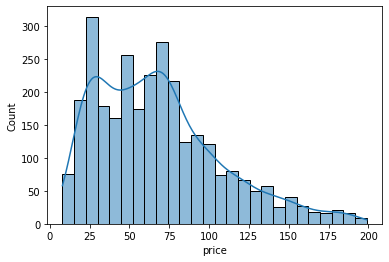

In [310]:
sns.histplot(D4['price'], kde=True)

In [311]:
def PrecioEsperado(acomodacion,camas):

 resultado=acomodacion*14.56160235+camas*1.32526322+20.20805018690333
 return resultado

In [312]:
print(PrecioEsperado(3,2))
print(PrecioEsperado(3,3))
print(PrecioEsperado(1,1))
print(PrecioEsperado(4,3))

66.54338367690332
67.86864689690333
36.094915756903326
82.43024924690332


# Conclusiones
Después del análisis realizado a los datos, podemos concluir lo siguiente:


*   Por lo visto en la prueba de hipótesis, podemos asegurar que no hay evidencia de que haya alguna zona con precio promedio significativamente diferente a las 
demás.
*   De la conclusión anterior podemos deducir que en todas las zonas hay buenos alojamientos, los cuales serian los mostrados en el mapa.
* Por último, se pudo ver que las principales características que afectan el precio de alojamiento serian el número de huéspedes y número de camas. Además, teniendo estos datos, podemos tener un aproximado del precio gracias al modelo de regresión antes creado.